# כמה אפשר לקוונטט ?

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio
from scipy.io import wavfile

In [2]:
def plot_waveform(data, fs, cut_t = 0.3):
    display(Audio(data, rate=fs))
    cut_n = int(cut_t * fs)
    fig,axes = plt.subplots(2,1,figsize=(10,10))
    axes[0].plot(data[:cut_n], linewidth=0.3)
    axes[0].set_title('Waveform')
    axes[1].specgram(data, Fs=fs, NFFT=2048, noverlap=1024, cmap='jet',scale='dB',)
    axes[1].set_title('Spectrogram')
    plt.show()

In [3]:
def quantize_signal(signal, n_bits):
    """
    Quantizes an input signal in [-1, 1] to n_bits using mid-riser levels,
    then returns the quantized value = nearest_level * (2^n_bits).
    """
    signal = signal/np.max(np.abs(signal))
    # Number of quantization levels
    num_levels = 2 ** n_bits

    # Step 1: Generate the mid-riser levels
    # levels[i] = ( (2*i + 1) / (2^n_bits) ) - 1
    levels = np.array([(2*i + 1) / num_levels - 1 for i in range(num_levels)])

    # Step 2: For each sample, find the nearest level
    # We'll do this in a vectorized way using broadcasting.
    #   1) Expand signal to shape (len(signal), 1)
    #   2) Compute absolute differences to each level
    #   3) Argmin over the level dimension
    diffs = np.abs(signal.reshape(-1, 1) - levels.reshape(1, -1))
    indices = np.argmin(diffs, axis=1)

    # Step 3: Map each sample to nearest_level * 2^n_bits
    quantized_levels = levels[indices]       # nearest level
    quantized_output = quantized_levels
    return quantized_output



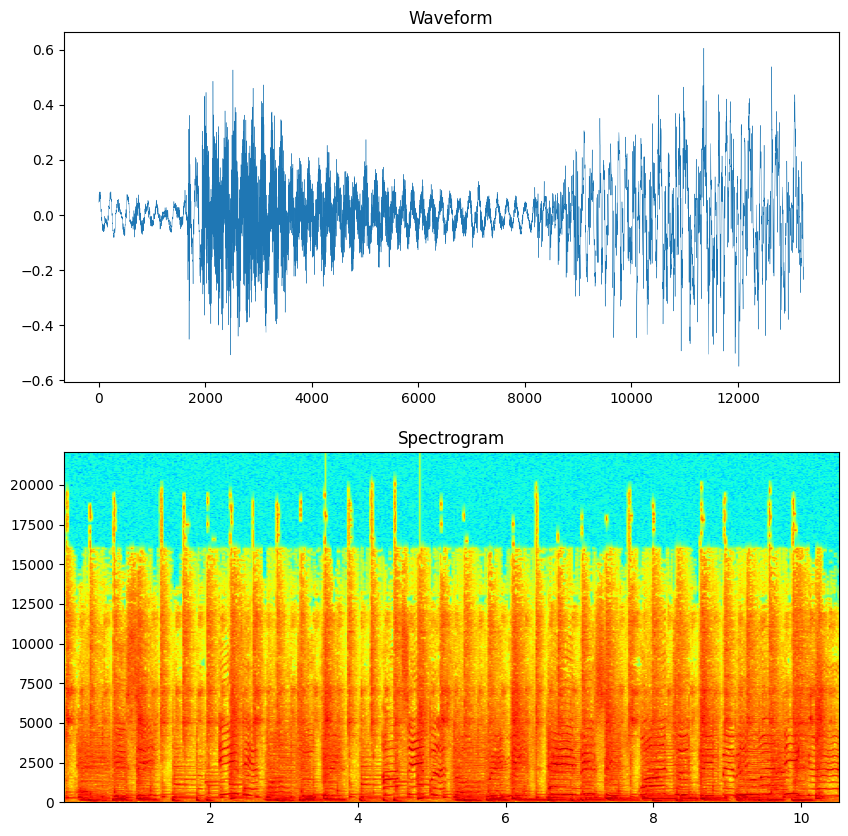

In [4]:
# Load the data in 16 bits
fs, data = wavfile.read('sounds/jackson5 - 16bit.wav')
normalize_data = data / np.max(np.abs(data))
plot_waveform(normalize_data, fs)

### 5 bits

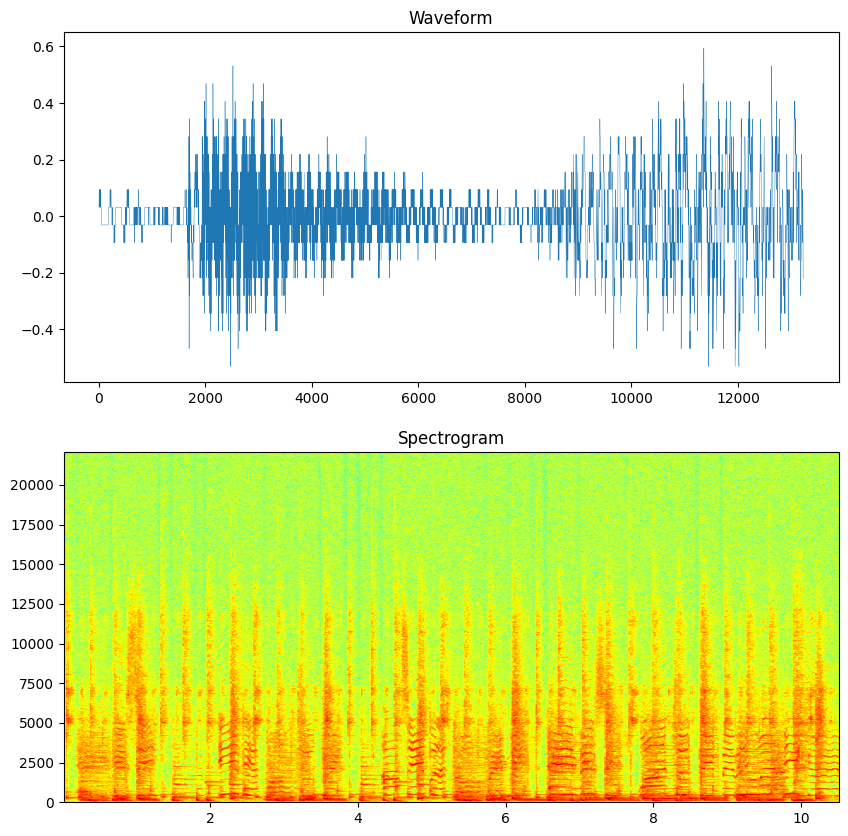

In [5]:
n_bits = 5
quantize_signal_data = quantize_signal(data,n_bits)
plot_waveform(quantize_signal_data, fs)

### 4 bits

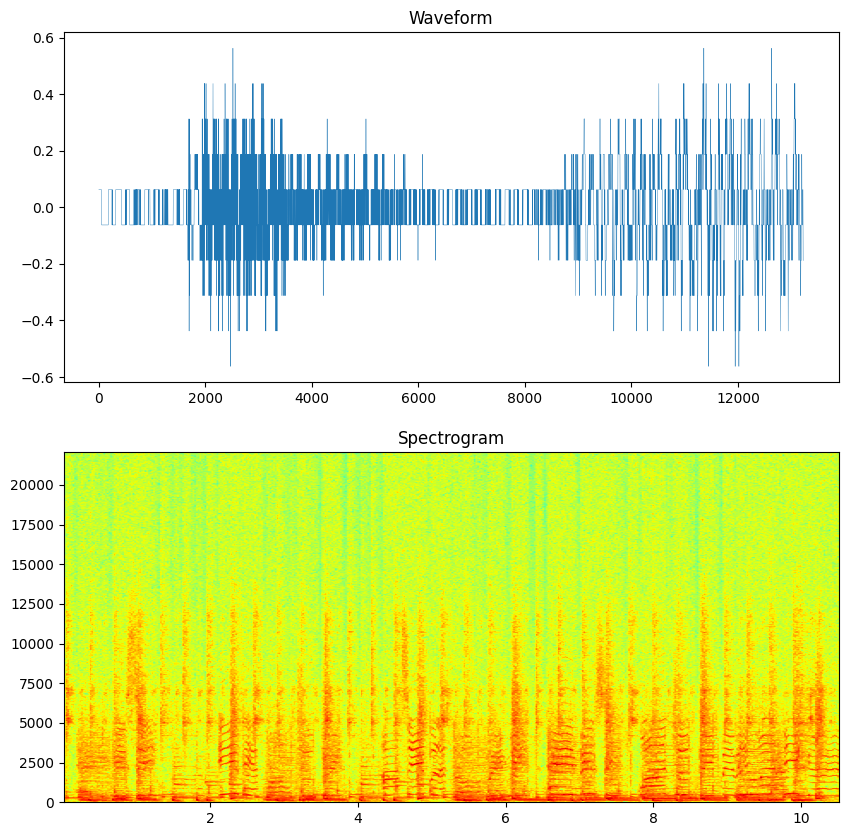

In [6]:
n_bits = 4
quantize_signal_data = quantize_signal(data,n_bits)
plot_waveform(quantize_signal_data, fs)

### 3 bits

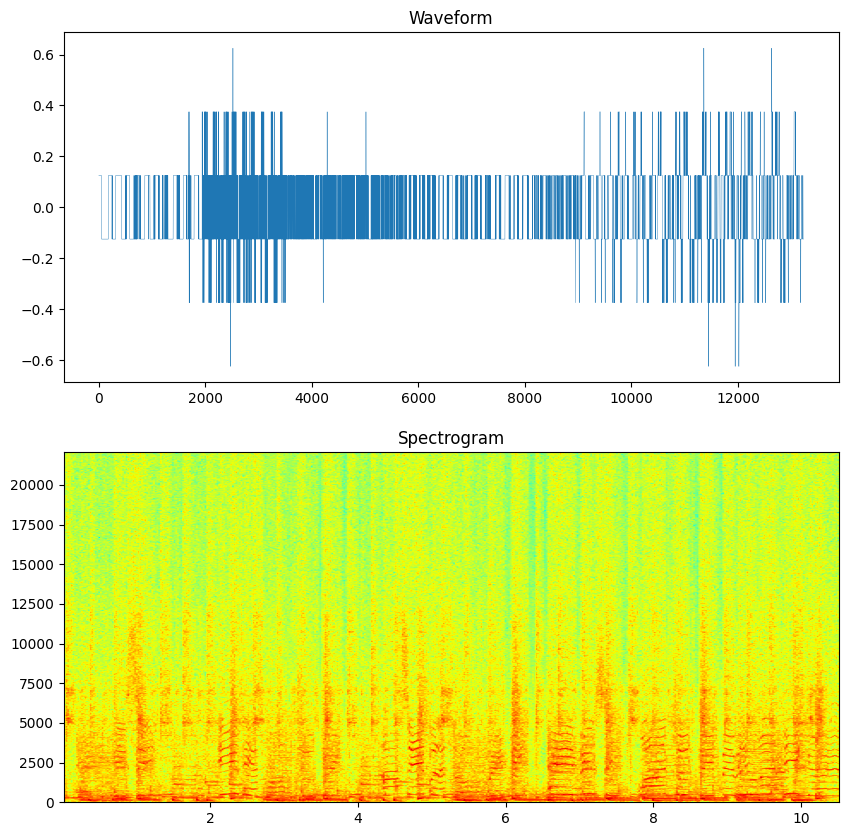

In [7]:
n_bits = 3
quantize_signal_data = quantize_signal(data,n_bits)
plot_waveform(quantize_signal_data, fs)

### 2 bits

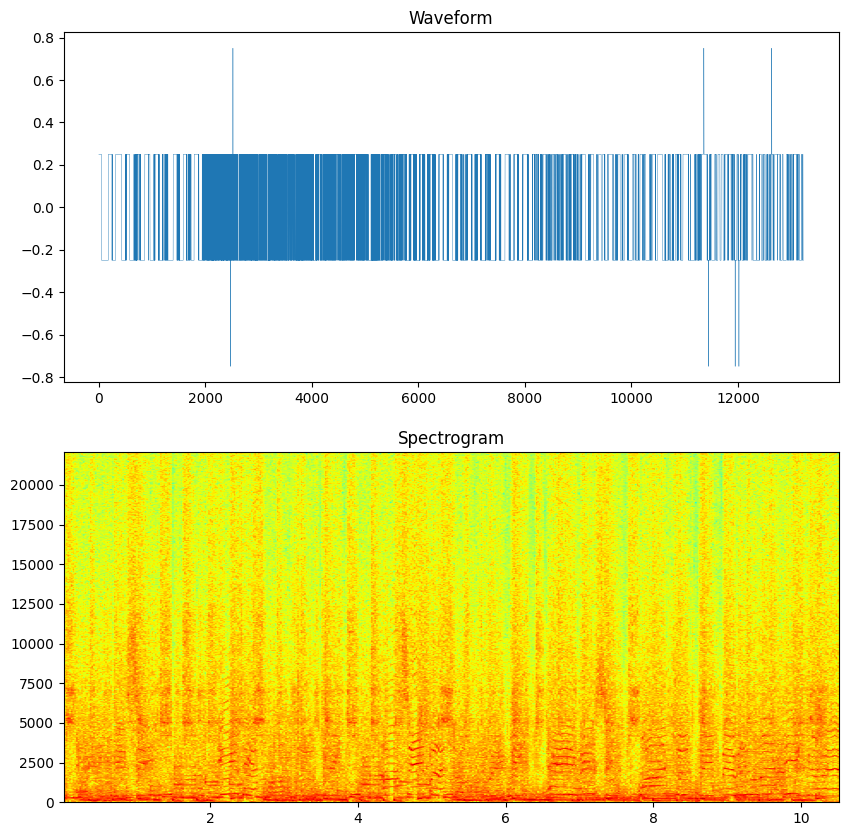

In [8]:
n_bits = 2
quantize_signal_data = quantize_signal(data,n_bits)
plot_waveform(quantize_signal_data, fs)

### 1 bit!!!

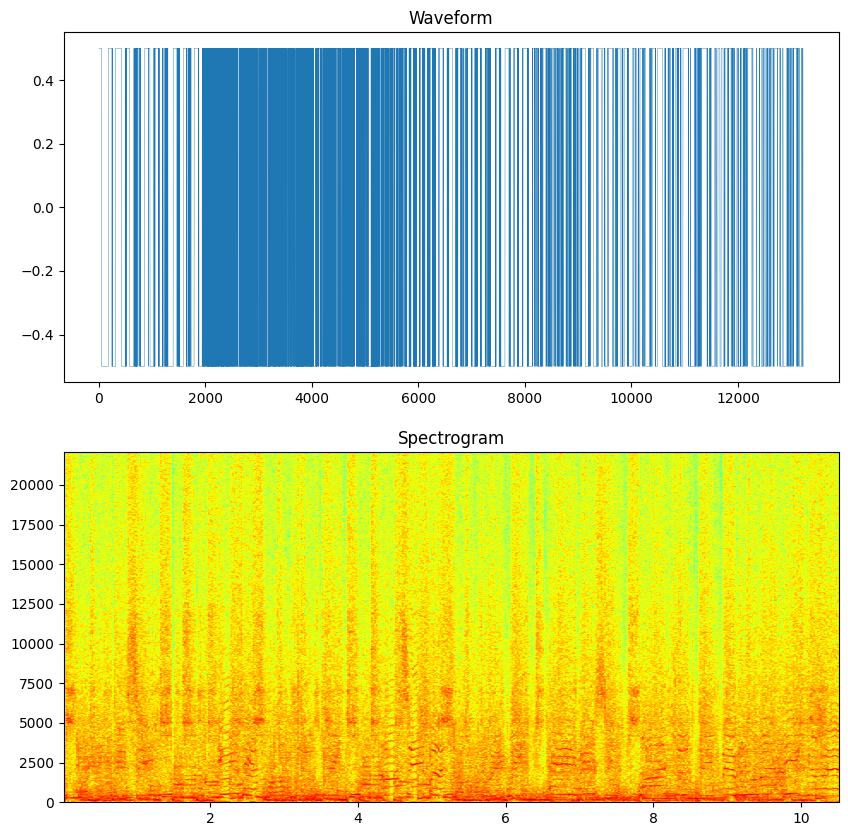

In [9]:
n_bits = 1
quantize_signal_data = quantize_signal(data,n_bits)
plot_waveform(quantize_signal_data, fs)

### PSD for different quantization n_bits 

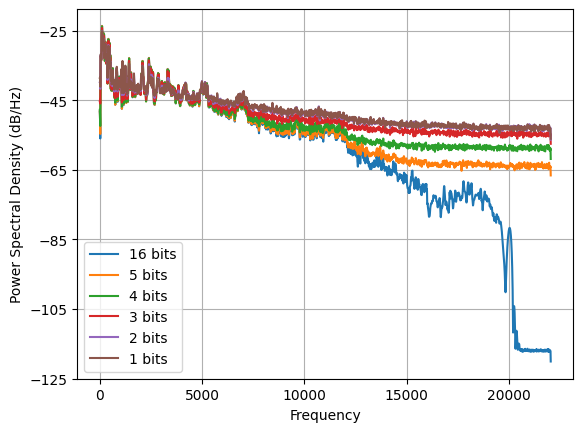

In [10]:
# plot all psd
psd_nfft = 4096
plt.figure()
normalize_data = data / np.sqrt(np.mean(np.abs(data.astype(np.float64))**2))
plt.psd(normalize_data, NFFT=psd_nfft, Fs=fs, label=f'{16} bits')
for n_bits in [5,4,3,2,1]:
    quantize_signal_data = quantize_signal(data,n_bits)
    # normalize the energy to 1
    quantize_signal_data = quantize_signal_data / np.sqrt(np.mean(np.abs(quantize_signal_data)**2))
    plt.psd(quantize_signal_data, NFFT=psd_nfft, Fs=fs, label=f'{n_bits} bits')
plt.legend()
plt.show()

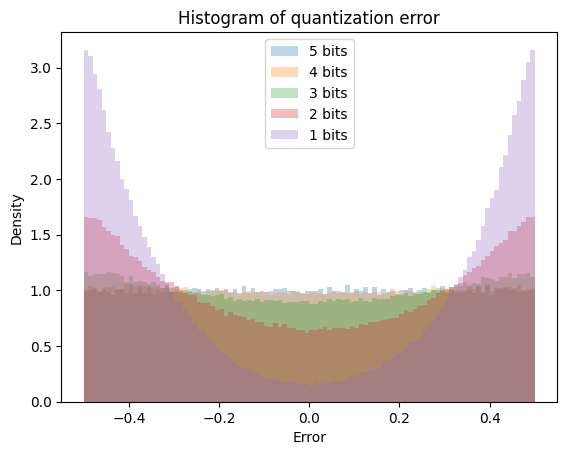

In [15]:
normalized_data = data/np.max(np.abs(data))
plt.figure()
for n_bits in [5,4,3,2,1]:
    n_levels = 2**n_bits
    level_size = 2/n_levels
    quantize_signal_data = quantize_signal(data,n_bits)
    diffs = (quantize_signal_data - normalized_data)/level_size
    plt.hist(diffs,bins=100,alpha=0.3, label =f"{n_bits} bits",density=True)
plt.title('Histogram of quantization error')
plt.xlabel('Error')
plt.ylabel('Density')
plt.legend()
plt.show()